### ****Run Biclustering****

In [15]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
import matplotlib.colors as colors
import sys
import os
from sklearn.cluster import SpectralCoclustering
import json

In [ ]:
sample_ids = [
             'MBC_1A',
             'MBC_1B',
             'MBC_2A',
             'MBC_2B',
             'MBC_3A',
             'MBC_3B',
             'MBC_4A',
             'MBC_4B',
             'CID4465',
             'CID444971',
             '1142243F',
             '1160920F'
            ]

In [67]:
sample_ids = ['MBC_1A','CID444971',]

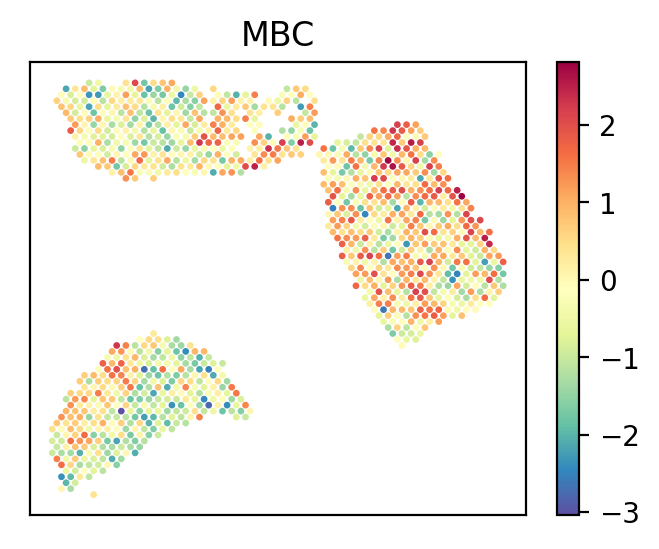

In [239]:
from scipy.stats import zscore

for sample_id in sample_ids:
    
    
    map_info = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'map_info.csv')
    
    mu_poe_stack_df = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'nb_file2.csv')
    mu_poe_stack_df.index = mu_poe_stack_df.iloc[:,0]
    mu_poe_stack_df = mu_poe_stack_df.drop(mu_poe_stack_df.columns[0], axis=1)
    
    mu_poe_stack_df = mu_poe_stack_df.T.apply(zscore).T    
    #c_max = 1#0.5
    #c_min = 0#-1.5
    
    c_max = 2
    c_min = -2

    image_slide_z = 1

    #all_spot = mu_poe_stack_df[[spot_id.split('-')[-1]==sample_ids[image_slide_z]for spot_id in mu_poe_stack_df.index ]]
    all_spot = mu_poe_stack_df
    
    all_loc = np.array(map_info.loc[map_info['sample']==sample_id,['array_col','array_row']])

    fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)
    for i in range(1):
        for j in range(1):
            plotted_cell_idx = 10
            if plotted_cell_idx<mu_poe_stack_df.shape[1]:
                plotted_cell= mu_poe_stack_df.columns[plotted_cell_idx]
                #ax=axs[i,j]
                
                #ddd = ddd/ddd.max()
                ddd = pd.DataFrame(all_spot.loc[:,plotted_cell])
                ddd = np.array(ddd)
                #ddd = np.array(ddd.T.apply(zscore).T)
                #ddd = (ddd-ddd.min())/(ddd.max()-ddd.min())
                #ddd = np.clip(ddd, -1, 2)
                g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=ddd,cmap='Spectral_r',
                             #vmin=c_min, vmax=c_max
                            )
                plt.colorbar(g, ax=ax)
                ax.set_title(plotted_cell)
                ax.set_xticks([])
                ax.set_yticks([]) 

In [81]:
pd.DataFrame(all_spot.loc[:,plotted_cell])

,MBC
Unnamed: 0,
AACATTGGTCAGCCGT-1,-2.142182
CATCGAATGGATCTCT-1,0.350789
CGGGTTGTAGCTTTGG-1,0.907701
CCTAAGTGTCTAACCG-1,-1.001413
TCTGTGACTGACCGTT-1,-0.715551
...,...
TGCAGTGGTAGGGAAC-1,0.264023
AGCGAGACGTGAAGGC-1,-1.053659
CAGTGTTAATCTCTCA-1,0.031912


In [83]:
(med_library/adata_sample.to_df().sum(axis=1))* (all_spot.loc[:,plotted_cell])

AACATTGGTCAGCCGT-1   -28.848147
CATCGAATGGATCTCT-1     1.253162
CGGGTTGTAGCTTTGG-1     0.595024
CCTAAGTGTCTAACCG-1   -11.392336
TCTGTGACTGACCGTT-1    -0.947588
                        ...    
TGCAGTGGTAGGGAAC-1     0.591668
AGCGAGACGTGAAGGC-1    -1.217989
CAGTGTTAATCTCTCA-1     0.122528
GATCGCTGTGGTGCGT-1    -2.833658
CTCTGCAGGCATTCTT-1     1.350525
Length: 1162, dtype: float64

In [123]:
adata_sample.to_df()[np.intersect1d(np.array(adata_sample.var_names),np.array(df_sig.iloc[:,0].values.flatten().astype(str)))].sum(axis=1)

AACATTGGTCAGCCGT-1     0.0
CATCGAATGGATCTCT-1     3.0
CGGGTTGTAGCTTTGG-1    10.0
CCTAAGTGTCTAACCG-1     2.0
TCTGTGACTGACCGTT-1     3.0
                      ... 
TGCAGTGGTAGGGAAC-1     3.0
AGCGAGACGTGAAGGC-1     5.0
CAGTGTTAATCTCTCA-1     3.0
GATCGCTGTGGTGCGT-1     2.0
CTCTGCAGGCATTCTT-1     2.0
Length: 1162, dtype: float64

In [ ]:
(med_library/adata_sample.to_df().sum(axis=1))* 

(all_spot.loc[:,plotted_cell]) *  

adata_sample.to_df()[np.intersect1d(np.array(adata_sample.var_names),np.array(df_sig.iloc[:,0].values.flatten().astype(str)))].sum(axis=1)


In [94]:
signature_path = '../data'
sig_fname = os.path.join(signature_path,  'bc_signatures_version_1216.csv')
df_sig = pd.read_csv(sig_fname)
df_sig.columns = df_sig.columns.str.replace('.', ' ')
df_sig.columns = df_sig.columns.str.replace('_', ' ')
df_sig.columns = df_sig.columns.str.replace('-', ' ')
df_sig.columns = df_sig.columns.str.replace('+', '')

<ipython-input-94-7ec7f807ea81>:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df_sig.columns = df_sig.columns.str.replace('.', ' ')
<ipython-input-94-7ec7f807ea81>:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df_sig.columns = df_sig.columns.str.replace('+', '')


In [152]:
med_library = adata_sample.to_df().sum(axis=1).median()

all_spot_norm = all_spot.copy()
for i in all_spot_norm.columns:
    all_spot_norm.loc[:,i] = (med_library/adata_sample.to_df().sum(axis=1))* (all_spot.loc[:,i])

/Users/siyuhe/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


KeyboardInterrupt: 

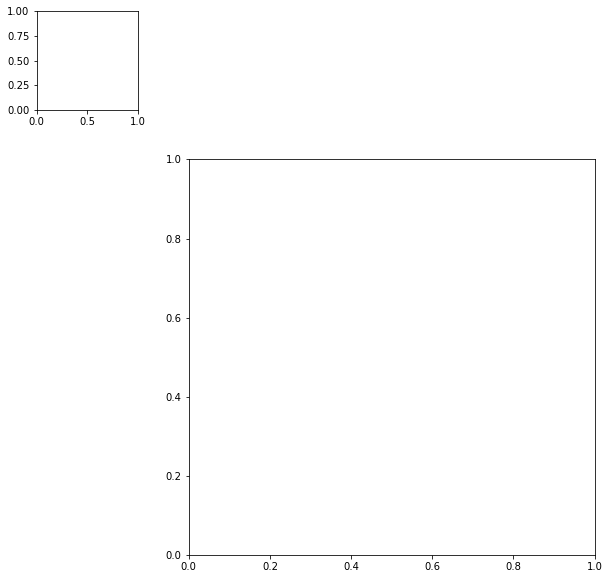

In [247]:
sns.clustermap(factor_norm_all,cmap='RdBu_r')

In [270]:
data_path='../data'
sample_ids = [
             'MBC_1A',
             'MBC_1B',
             'MBC_2A',
             'MBC_2B',
             'MBC_3A',
             'MBC_3B',
             'MBC_4A',
             'MBC_4B',
             'CID4465',
             'CID444971',
             '1142243F',
             '1160920F'
            ]
#sample_ids = ['CID444971']
factor_norm_all = []
#sample_ids = ['MBC_1A']
adata_samples = []
for sample_id in sample_ids: 
    print('workng on',sample_id)

    if sample_id.startswith('MBC'):

        adata_sample = sc.read_visium(path=os.path.join(data_path, sample_id),library_id =  sample_id)
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
    else:
        adata_sample = sc.read_h5ad(os.path.join(data_path,sample_id, sample_id+'.h5ad'))
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
    adata_samples.append(adata_sample)

workng on MBC_1A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_1B


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_2A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_2B


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_3A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_3B


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_4A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_4B
workng on CID4465
workng on CID444971
workng on 1142243F
workng on 1160920F


In [272]:
adata_samples = anndata.concat(adata_samples)

/Users/siyuhe/anaconda3/lib/python3.8/site-packages/anndata/_core/merge.py:895: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [279]:
med_library = adata_samples.to_df().sum(axis=1).median()

In [280]:
med_library

5243.0

In [316]:
data_path='../data'
sample_ids = [
             'MBC_1A',
             'MBC_1B',
             'MBC_2A',
             'MBC_2B',
             'MBC_3A',
             'MBC_3B',
             'MBC_4A',
             'MBC_4B',
             'CID4465',
             'CID444971',
             '1142243F',
             '1160920F'
            ]
#sample_ids = ['CID444971']
factor_norm_all = []
#sample_ids = ['MBC_1A']
for sample_id in sample_ids: 
    print('workng on',sample_id)

    if sample_id.startswith('MBC'):

        adata_sample = sc.read_visium(path=os.path.join(data_path, sample_id),library_id =  sample_id)
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
    else:
        adata_sample = sc.read_h5ad(os.path.join(data_path,sample_id, sample_id+'.h5ad'))
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
        
        
    
    sc.pp.normalize_total(adata_sample, target_sum = med_library, inplace=True) 

    # Preprocessing3: Logarithm
    print('Preprocessing3: Logarithm')
    #sc.pp.log1p(adata_sample)
    
    map_info = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'map_info.csv')
    all_loc = np.array(map_info.loc[map_info['sample']==sample_id,['array_col','array_row']])
        
    mu_poe_stack_df = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'nb_file2.csv')
    mu_poe_stack_df.index = mu_poe_stack_df.iloc[:,0]
    mu_poe_stack_df = mu_poe_stack_df.drop(mu_poe_stack_df.columns[0], axis=1)
    
    factor_norm = pd.DataFrame(index = adata_sample.obs_names)
    all_spot = mu_poe_stack_df
    
    
    for i in range(all_spot_norm.columns.shape[0]):
    #for i in range(10,10):    
        plotted_cell_idx = i
        plotted_cell= mu_poe_stack_df.columns[plotted_cell_idx]
        
        pos_median = all_spot.sum(axis=1)[all_spot.sum(axis=1)>0].median()
        
        neg_median = all_spot.sum(axis=1)[all_spot.sum(axis=1)<=0].median()
        
        ddd = all_spot.loc[:,plotted_cell].copy()

        for i in range(ddd.shape[0]):
            if ddd[i]>0:
                
                ddd[i] = (neg_median / all_spot.sum(axis=1)[i])* ddd[i]
            else: 
                
                ddd[i] = (pos_median / all_spot.sum(axis=1)[i])* ddd[i]
        
    
        ddd = ddd *  adata_sample.to_df()[np.intersect1d(np.array(adata_sample.var_names),np.array(df_sig.iloc[:,plotted_cell_idx].values.flatten().astype(str)))].mean(axis=1)
        #(med_library/adata_sample.to_df().sum(axis=1))* 
        #ddd = (all_spot.loc[:,plotted_cell])
        #(med_library/adata_sample.to_df().sum(axis=1))* (all_spot.loc[:,plotted_cell])* adata_sample.to_df().sum(axis=1)
        factor_norm[plotted_cell]=ddd
        
        #fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)
        #g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=ddd,cmap='Spectral_r',
                             #vmin=-40, vmax=40
        #                    )
        #plt.colorbar(g, ax=ax)
        #ax.set_title(plotted_cell)
        #ax.set_xticks([])
    factor_norm.index = factor_norm.index+'-'+sample_id
        
    factor_norm_all.append(factor_norm)
  


workng on MBC_1A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm
workng on MBC_1B


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm
workng on MBC_2A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm
workng on MBC_2B


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_3A
Preprocessing3: Logarithm


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_3B
Preprocessing3: Logarithm
workng on MBC_4A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


workng on MBC_4B
Preprocessing3: Logarithm
workng on CID4465
Preprocessing3: Logarithm
workng on CID444971
Preprocessing3: Logarithm
workng on 1142243F
Preprocessing3: Logarithm
workng on 1160920F
Preprocessing3: Logarithm


KeyboardInterrupt: 

In [315]:
all_spot.sum(axis=1)[i],all_spot.sum(axis=1)[all_spot.sum(axis=1)<=0].median()

(-153.997865319252, -95.72054553031921)

In [311]:
all_spot.loc[:,plotted_cell].copy()

Unnamed: 0
TGTTGGCTGGCGGAAG-1   -14.232636
GCATCCTCTCCTATTA-1    14.141747
GCGAGGGACTGCTAGA-1    -4.007278
TGGTACCGGCACAGCC-1   -18.915955
GCGCGTTTAAATCGTA-1    -5.455591
                        ...    
AGAGTCTTAATGAAAG-1    -6.869934
GAACGTTTGTATCCAC-1   -10.628697
ATTGAATTCCCTGTAG-1    -2.880999
TACCTCACCAATTGTA-1    -6.938085
AGTCGAATTAGCGTAA-1    -4.336885
Name: Plasmablasts, Length: 4895, dtype: float64

In [310]:
all_spot.sum(axis=1)[all_spot.sum(axis=1)>0]

Unnamed: 0
GACGACTTTCCAAGAA-1     7.143192
GGTTGTATCGTGAAAT-1    23.255415
GCTGTCTGTGATCGAC-1    51.554898
AAAGACATGAAGTTTA-1     1.157956
CGCCCTTACATCCACC-1    49.967429
                        ...    
CCATGGCAAACGCTCA-1    32.214001
GATTAGAAACAAGCGT-1    19.311252
AGAATACAGGCTATCC-1    26.511134
CAAGTCGTTGAAATCT-1    29.470416
ATTCGTGTACCCATTC-1    12.864487
Length: 234, dtype: float64

In [309]:
 all_spot.loc[:,plotted_cell].copy()[0]

-14.232636451721191

In [283]:
adata_sample.to_df().sum(axis=1)

TGTTGGCTGGCGGAAG-1    5243.0
GCATCCTCTCCTATTA-1    5243.0
GCGAGGGACTGCTAGA-1    5243.0
TGGTACCGGCACAGCC-1    5243.0
GCGCGTTTAAATCGTA-1    5243.0
                       ...  
AGAGTCTTAATGAAAG-1    5243.0
GAACGTTTGTATCCAC-1    5243.0
ATTGAATTCCCTGTAG-1    5243.0
TACCTCACCAATTGTA-1    5243.0
AGTCGAATTAGCGTAA-1    5243.0
Length: 4895, dtype: float64

workng on MBC_1A


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing3: Logarithm


<ipython-input-258-2ac76da9ea31>:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)


workng on 1142243F
Preprocessing3: Logarithm


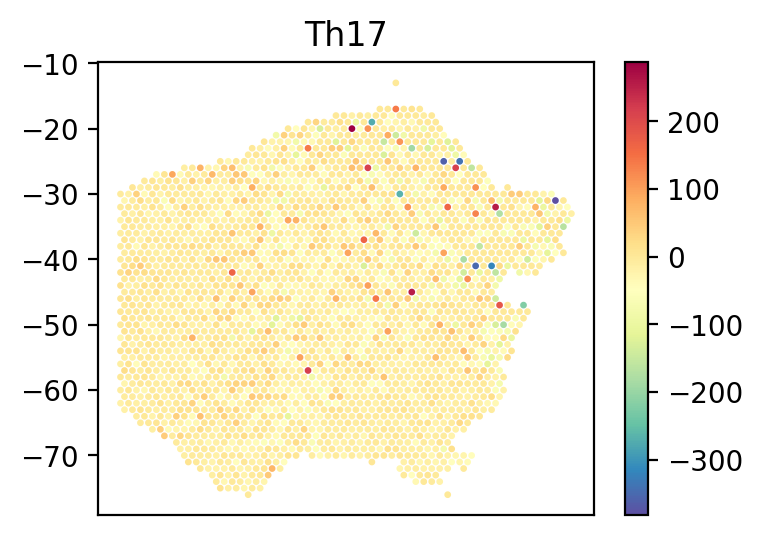

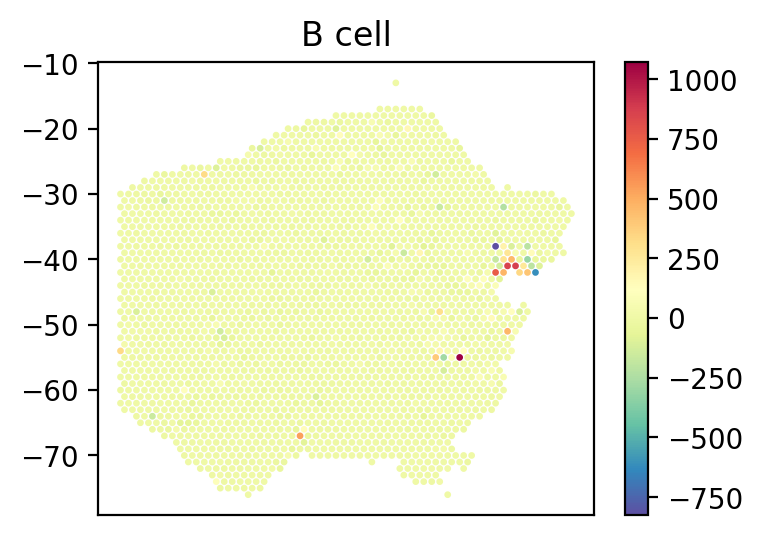

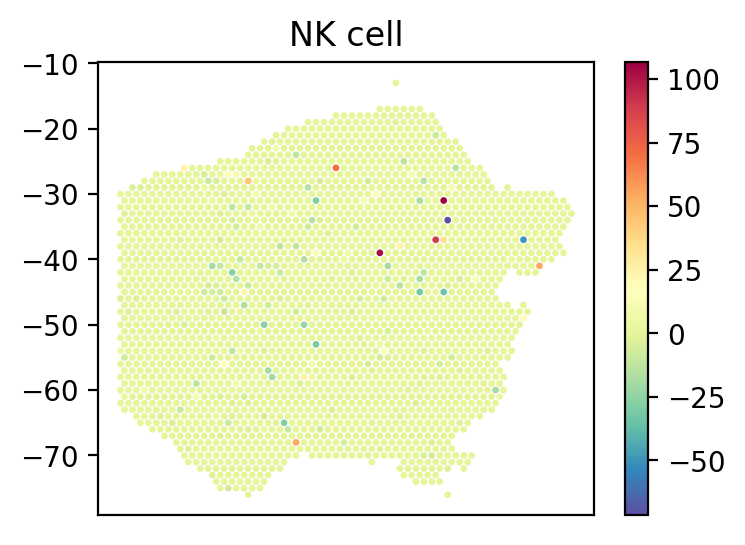

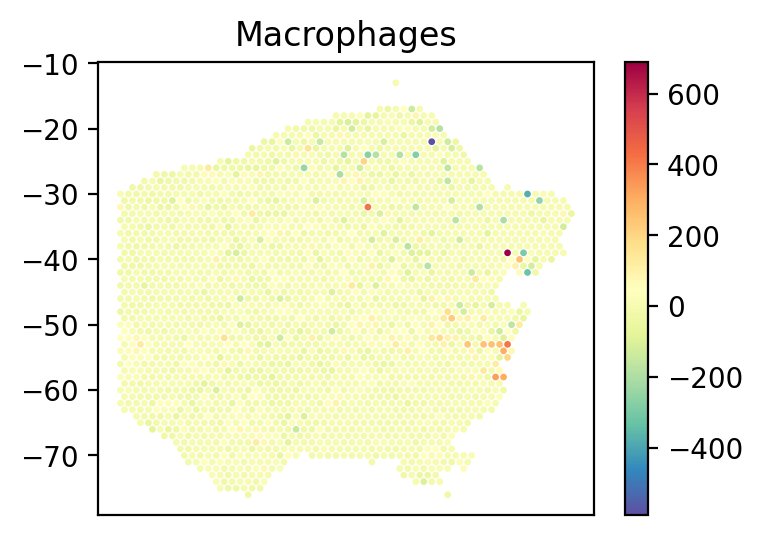

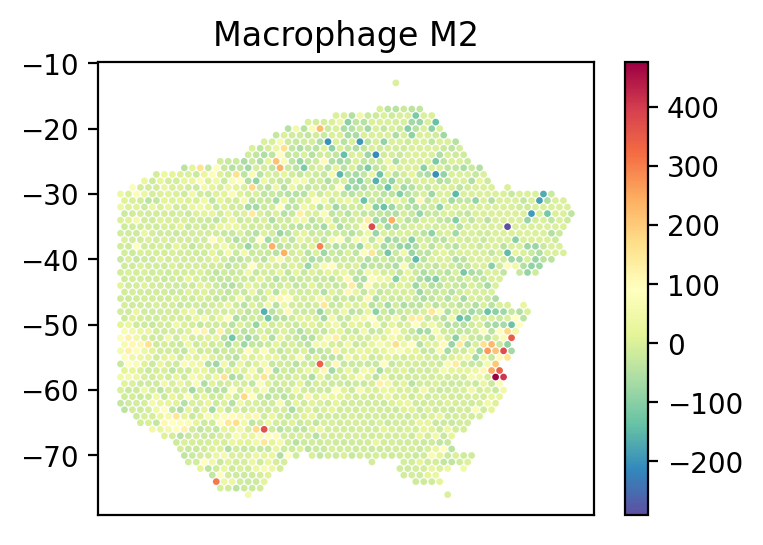

...

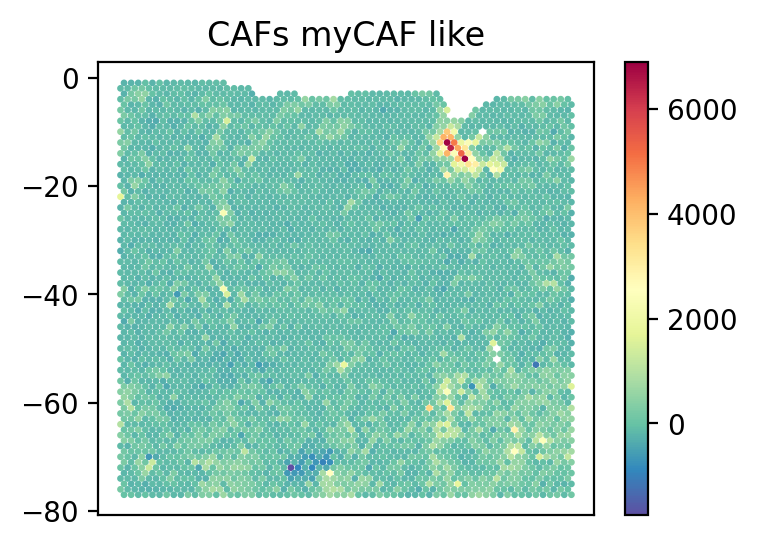

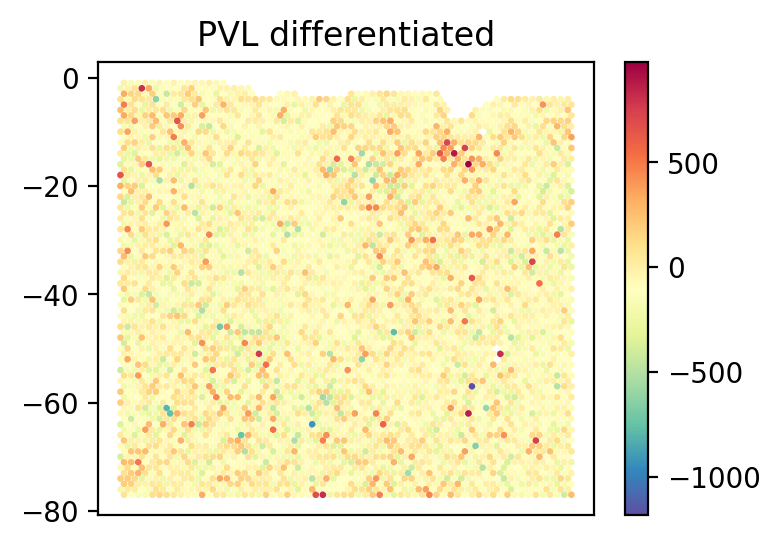

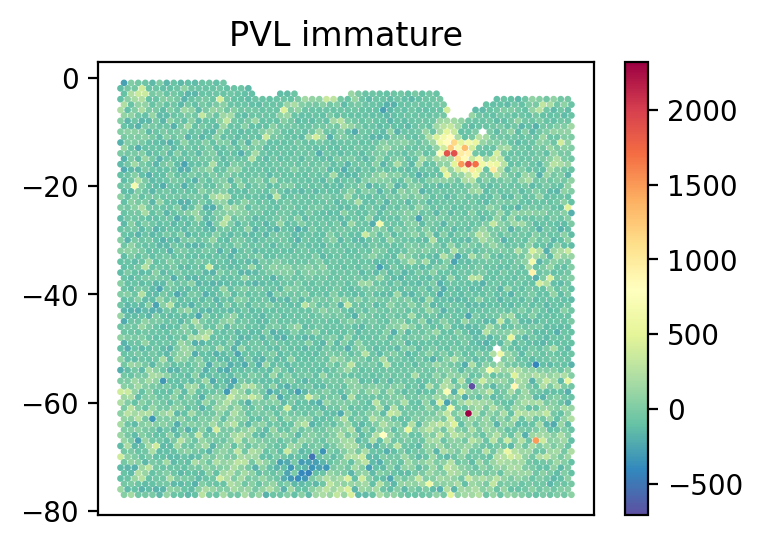

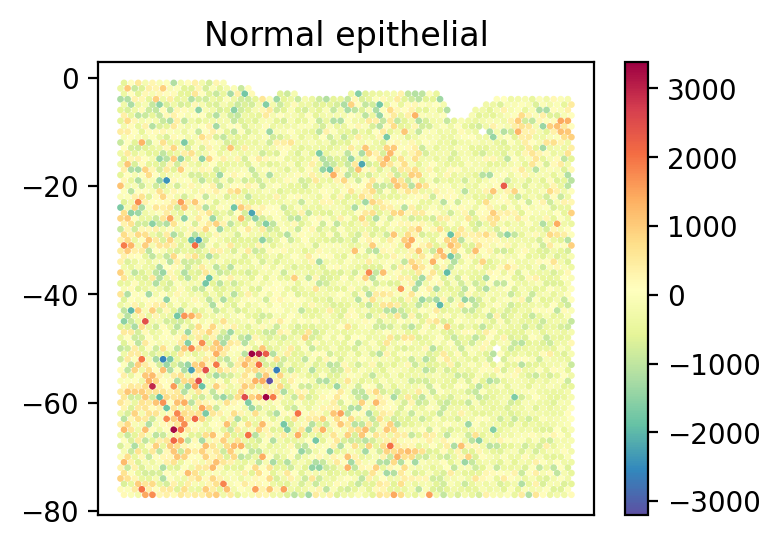

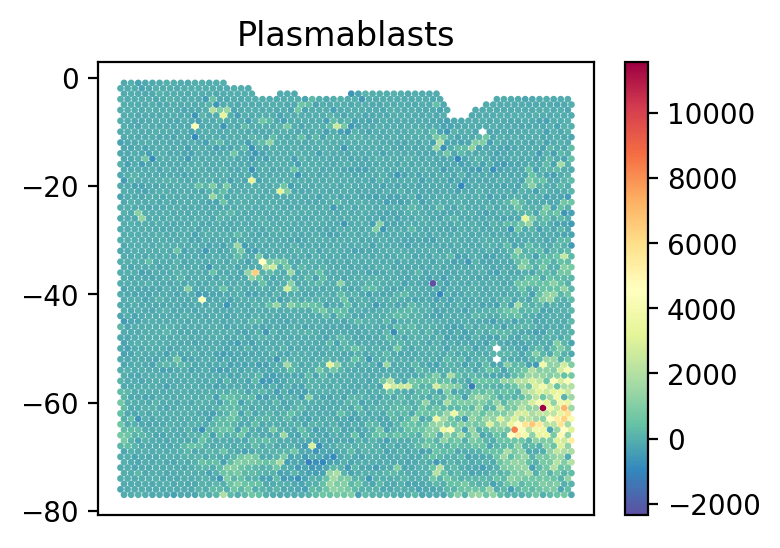

In [258]:
data_path='../data'
sample_ids = [
             'MBC_1A',
             'MBC_1B',
             'MBC_2A',
             'MBC_2B',
             'MBC_3A',
             'MBC_3B',
             'MBC_4A',
             'MBC_4B',
             'CID4465',
             'CID444971',
             '1142243F',
             '1160920F'
            ]
sample_ids = ['MBC_1A','1142243F']
factor_norm_all = []
#sample_ids = ['MBC_1A']
for sample_id in sample_ids: 
    print('workng on',sample_id)

    if sample_id.startswith('MBC'):

        adata_sample = sc.read_visium(path=os.path.join(data_path, sample_id),library_id =  sample_id)
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
    else:
        adata_sample = sc.read_h5ad(os.path.join(data_path,sample_id, sample_id+'.h5ad'))
        adata_sample.var_names_make_unique()
        adata_sample.obs['sample']=sample_id
        #adata_sample.obs_names  = adata_sample.obs_names+'-'+sample_id
        
        
    
    sc.pp.normalize_total(adata_sample, inplace=True) 

    # Preprocessing3: Logarithm
    print('Preprocessing3: Logarithm')
    #sc.pp.log1p(adata_sample)
    
    map_info = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'map_info.csv')
    all_loc = np.array(map_info.loc[map_info['sample']==sample_id,['array_col','array_row']])
        
    mu_poe_stack_df = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'nb_file2.csv')
    mu_poe_stack_df.index = mu_poe_stack_df.iloc[:,0]
    mu_poe_stack_df = mu_poe_stack_df.drop(mu_poe_stack_df.columns[0], axis=1)
    
    factor_norm = pd.DataFrame(index = adata_sample.obs_names)
    all_spot = mu_poe_stack_df
    
    med_library = adata_sample.to_df().sum(axis=1).median()
    for i in range(all_spot_norm.columns.shape[0]):
    #for i in range(10,10):    
        plotted_cell_idx = i
        plotted_cell= mu_poe_stack_df.columns[plotted_cell_idx]
    
        ddd =(med_library/adata_sample.to_df().sum(axis=1))* (all_spot.loc[:,plotted_cell]) *  adata_sample.to_df()[np.intersect1d(np.array(adata_sample.var_names),np.array(df_sig.iloc[:,plotted_cell_idx].values.flatten().astype(str)))].sum(axis=1)
        #(med_library/adata_sample.to_df().sum(axis=1))* (all_spot.loc[:,plotted_cell])* adata_sample.to_df().sum(axis=1)
        factor_norm[plotted_cell]=ddd
        
        fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)
        g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=ddd,cmap='Spectral_r',
                             #vmin=-40, vmax=40
                            )
        plt.colorbar(g, ax=ax)
        ax.set_title(plotted_cell)
        ax.set_xticks([])
    factor_norm.index = factor_norm.index+'-'+sample_id
        
    factor_norm_all.append(factor_norm)
  

    

In [318]:
factor_norm_all

[                               Th17    B cell   NK cell  Macrophages  \
 AAACACCAATAACTGC-1-MBC_1A  0.026107  0.000000  0.307395     0.397123   
 AAACAGCTTTCAGAAG-1-MBC_1A  0.530578  0.004684  0.000000     0.175281   
 AAACAGGGTCTATATT-1-MBC_1A  0.000784  0.008027  0.000000     0.073019   
 AAACATGGTGAGAGGA-1-MBC_1A  0.085961  0.042444  0.000000     0.153380   
 AAACCGGGTAGGTACC-1-MBC_1A  5.413268  0.000000  1.032851     0.337483   
 ...                             ...       ...       ...          ...   
 TTGTTCAGTGTGCTAC-1-MBC_1A  0.000000  0.056123  0.000000     1.730745   
 TTGTTGTGTGTCAAGA-1-MBC_1A  0.000000  0.000000  0.000000     0.000000   
 TTGTTTCACATCCAGG-1-MBC_1A  0.006200  0.000000  0.000000     0.342650   
 TTGTTTCATTAGTCTA-1-MBC_1A  0.030116  0.064774  0.000000     0.195998   
 TTGTTTCCATACAACT-1-MBC_1A  0.122850  0.000000  0.000000     0.660338   
 
                            Macrophage M2      vCAFs  Endothelial      mCAFs  \
 AAACACCAATAACTGC-1-MBC_1A       3.266842 

In [319]:
factor_norm_all = pd.concat(factor_norm_all)

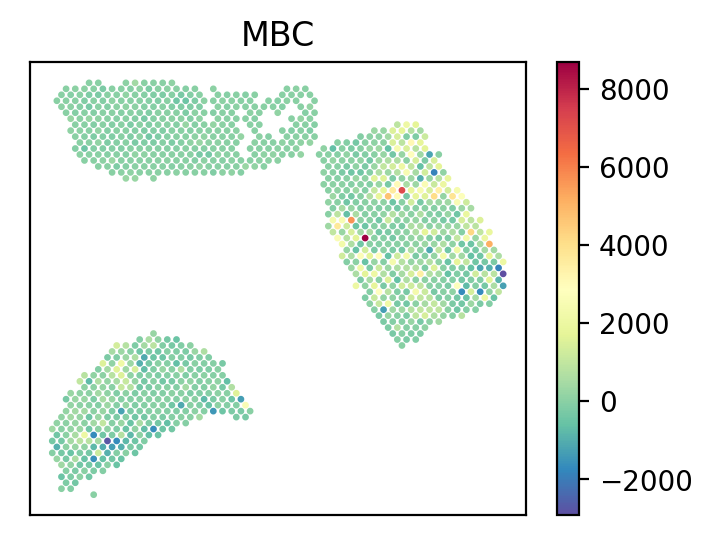

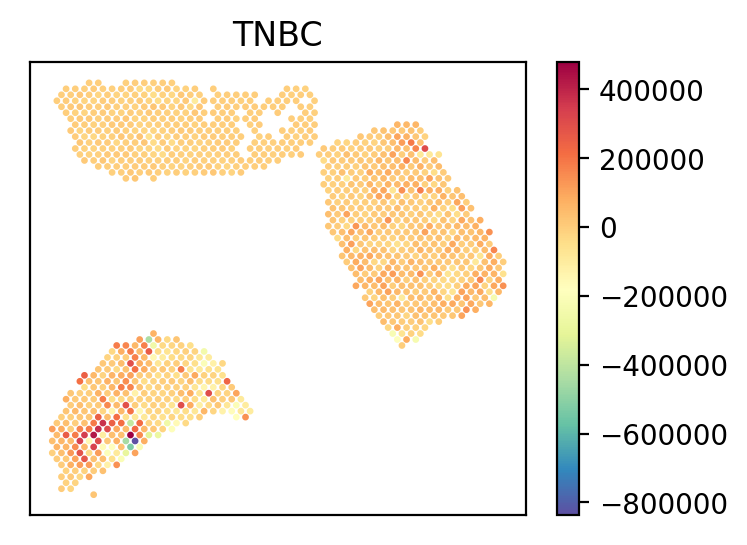

In [246]:
from scipy.stats import zscore

sample_ids = ['CID444971',]

for sample_id in sample_ids:
    
    
    map_info = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'map_info.csv')
    
    mu_poe_stack_df = pd.read_csv("../results/02_PoE_factor_0105/"+sample_id+'nb_file2.csv')
    mu_poe_stack_df.index = mu_poe_stack_df.iloc[:,0]
    mu_poe_stack_df = mu_poe_stack_df.drop(mu_poe_stack_df.columns[0], axis=1)
    
    mu_poe_stack_df = mu_poe_stack_df.T.apply(zscore).T    
    #c_max = 1#0.5
    #c_min = 0#-1.5
    
    c_max = 2
    c_min = -2

    image_slide_z = 1

    #all_spot = mu_poe_stack_df[[spot_id.split('-')[-1]==sample_ids[image_slide_z]for spot_id in mu_poe_stack_df.index ]]
    all_spot = mu_poe_stack_df
    
    all_loc = np.array(map_info.loc[map_info['sample']==sample_id,['array_col','array_row']])

    fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)
    for i in range(1):
        for j in range(1):
            plotted_cell_idx = 10
            if plotted_cell_idx<mu_poe_stack_df.shape[1]:
                plotted_cell= mu_poe_stack_df.columns[plotted_cell_idx]
                #ax=axs[i,j]
                
                #ddd = ddd/ddd.max()
                ddd = pd.DataFrame(all_spot_norm.loc[:,plotted_cell])
                ddd = np.array(ddd)
                #ddd = np.array(ddd.T.apply(zscore).T)
                #ddd = (ddd-ddd.min())/(ddd.max()-ddd.min())
                #ddd = np.clip(ddd, -1, 2)
                g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=ddd,cmap='Spectral_r',
                             #vmin=-60, vmax=60
                            )
                plt.colorbar(g, ax=ax)
                ax.set_title(plotted_cell)
                ax.set_xticks([])
                ax.set_yticks([]) 
                
    fig,ax= plt.subplots(1,1,figsize=(4,3),dpi=200)
                
    for i in range(1):
        for j in range(1):
            plotted_cell_idx = 11
            if plotted_cell_idx<mu_poe_stack_df.shape[1]:
                plotted_cell= mu_poe_stack_df.columns[plotted_cell_idx]
                #ax=axs[i,j]
                
                #ddd = ddd/ddd.max()
                ddd = pd.DataFrame(all_spot_norm.loc[:,plotted_cell])
                ddd = np.array(ddd)
                #ddd = np.array(ddd.T.apply(zscore).T)
                #ddd = (ddd-ddd.min())/(ddd.max()-ddd.min())
                #ddd = np.clip(ddd, -1, 2)
                g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=ddd,cmap='Spectral_r',
                             #vmin=c_min, vmax=c_max
                            )
                plt.colorbar(g, ax=ax)
                ax.set_title(plotted_cell)
                ax.set_xticks([])
                ax.set_yticks([])

In [36]:
factor_all = pd.DataFrame()
#map_info = pd.read_csv("../results/02_PoE_factor/"+sample_id+'map_info.csv')
for sample_id in sample_ids:
    
    factor = pd.read_csv("../results/02_PoE_factor_0106/"+sample_id+'nb_file2.csv',index_col=0)
    factor.index = factor.index+'-'+sample_id
    #factor = (factor-factor.min())/(factor.max()-factor.min())
    factor_all = factor_all.append(factor)

In [37]:
factor_all

,Th17,B cell,NK cell,Macrophages,Macrophage M2,vCAFs,Endothelial,mCAFs,dCAFS,MDSC,...,cDC,pDC,Terminal exhaustion,Precursor exhaustion,CAFs MSC iCAF like,CAFs myCAF like,PVL differentiated,PVL immature,Normal epithelial,Plasmablasts
AAACACCAATAACTGC-1-MBC_1A,4.132140,-4.239511,8.423643,-8.823207,6.845149,-4.917947,-7.687112,-3.890087,-3.627959,-4.220423,...,-5.981880,3.187464,-6.034738,-4.948261,-6.213301,3.773991,-6.186585,7.549840,-6.219010,6.960142
AAACAGCTTTCAGAAG-1-MBC_1A,-4.023152,-6.524157,-14.579453,-7.611362,-3.786941,-3.879222,-5.787666,-3.802517,-6.894855,-4.688117,...,-1.661704,-7.835030,5.112310,-3.278505,-10.026458,-7.572523,-6.970086,-5.317605,-5.754316,4.190905
AAACAGGGTCTATATT-1-MBC_1A,-2.288083,-3.988985,-5.219018,-10.434052,-7.844185,-6.983563,-5.251420,-6.851384,-3.346309,-4.282725,...,-4.636136,-9.171648,1.472213,-8.210199,-6.819815,-8.564930,-8.320640,-10.830526,-8.576427,-2.719241
AAACATGGTGAGAGGA-1-MBC_1A,-5.854792,-3.667303,-10.010085,2.607017,-5.391269,-3.400608,-5.269001,-5.099654,4.320380,-0.642792,...,-5.763684,-1.893494,2.387717,-1.118364,-5.948433,-4.751945,-3.302113,-4.361712,-2.788559,-2.144738
AAACCGGGTAGGTACC-1-MBC_1A,8.988920,-7.613232,8.925648,5.317854,-6.583342,0.818971,3.451777,-5.176476,-4.366582,-3.961143,...,0.020562,-9.204961,6.752470,2.304551,-9.652829,-6.449228,-3.614765,-4.610699,9.174391,-5.546564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGAGTCTTAATGAAAG-1-1160920F,4.302619,-6.047781,-6.711951,-4.983709,-6.178016,-4.019602,-10.755327,-1.921423,-5.021279,-5.918501,...,-5.998867,-6.447989,-7.627557,-2.470106,-8.275172,-7.436681,-4.000786,-3.690315,10.947966,-8.404091
GAACGTTTGTATCCAC-1-1160920F,-9.281520,-11.314209,-4.468622,-6.011988,-9.883759,-1.691629,-6.235892,-7.808497,-6.962859,-6.774183,...,-7.668456,-5.457246,-21.567064,-1.431128,-12.807793,-17.654213,-1.560982,-11.900402,5.927169,-12.231947
ATTGAATTCCCTGTAG-1-1160920F,-14.339240,-13.114393,-10.217354,-7.749331,-9.859694,-9.820454,-8.115412,-5.000272,-6.025112,-7.818820,...,-7.876640,-11.342593,-17.909227,-4.836832,-12.676831,-17.068413,-5.037431,-7.982694,11.870914,-7.068613
TACCTCACCAATTGTA-1-1160920F,0.963058,-5.653973,-13.705020,-6.806028,-6.095278,-11.406810,-5.373850,-14.743139,-7.789060,-8.977862,...,-2.347712,-10.721647,-8.148562,7.701338,-11.733979,-19.976061,-5.256947,-5.183625,6.736567,-8.695570


In [39]:
import anndata
adata_samples = anndata.concat(adata_samples)

/Users/siyuhe/anaconda3/lib/python3.8/site-packages/anndata/_core/merge.py:895: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [40]:
adata_samples

AnnData object with n_obs × n_vars = 33958 × 18708
    obs: 'sample'

In [41]:
## get median for all samples
med_lib = adata_samples.to_df().sum(axis=1).median()

In [42]:
med_lib

5243.0

In [43]:
adata_samples_sum = adata_samples.to_df().sum(axis=1)

In [44]:
factor_all_norm = factor_all.copy()
for i in range(factor_all.shape[0]):
    factor_all_norm.iloc[i,:] = factor_all.iloc[i,:] * med_lib/adata_samples_sum[i]

In [45]:
factor_all_norm

,Th17,B cell,NK cell,Macrophages,Macrophage M2,vCAFs,Endothelial,mCAFs,dCAFS,MDSC,...,cDC,pDC,Terminal exhaustion,Precursor exhaustion,CAFs MSC iCAF like,CAFs myCAF like,PVL differentiated,PVL immature,Normal epithelial,Plasmablasts
AAACACCAATAACTGC-1-MBC_1A,6.797870,-6.974509,13.857911,-14.515241,11.261097,-8.090617,-12.646228,-6.399663,-5.968430,-6.943105,...,-9.840916,5.243763,-9.927872,-8.140488,-10.221631,6.208671,-10.177680,12.420399,-10.231023,11.450274
AAACAGCTTTCAGAAG-1-MBC_1A,-1.013472,-1.643499,-3.672708,-1.917377,-0.953968,-0.977214,-1.457970,-0.957891,-1.736882,-1.180983,...,-0.418600,-1.973721,1.287841,-0.825888,-2.525764,-1.907593,-1.755833,-1.339557,-1.449569,1.055730
AAACAGGGTCTATATT-1-MBC_1A,-0.263224,-0.458897,-0.600402,-1.200345,-0.902404,-0.803397,-0.604129,-0.788191,-0.384963,-0.492690,...,-0.533346,-1.055117,0.169365,-0.944511,-0.784559,-0.985319,-0.957216,-1.245956,-0.986642,-0.312825
AAACATGGTGAGAGGA-1-MBC_1A,-1.295328,-0.811362,-2.214654,0.576782,-1.192777,-0.752358,-1.165726,-1.128259,0.955851,-0.142213,...,-1.275171,-0.418921,0.528264,-0.247429,-1.316045,-1.051331,-0.730567,-0.964995,-0.616947,-0.474507
AAACCGGGTAGGTACC-1-MBC_1A,9.431441,-7.988028,9.365053,5.579650,-6.907436,0.859288,3.621707,-5.431311,-4.581547,-4.156148,...,0.021574,-9.658117,7.084891,2.418003,-10.128033,-6.766721,-3.792718,-4.837682,9.626042,-5.819619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGAGTCTTAATGAAAG-1-1160920F,1.074016,-1.509642,-1.675431,-1.244029,-1.542151,-1.003369,-2.684735,-0.479624,-1.253407,-1.477371,...,-1.497432,-1.609541,-1.903984,-0.616586,-2.065641,-1.856338,-0.998673,-0.921173,2.732822,-2.097822
GAACGTTTGTATCCAC-1-1160920F,-7.166864,-8.736436,-3.450513,-4.642246,-7.631892,-1.306216,-4.815137,-6.029448,-5.376476,-5.230787,...,-5.921313,-4.213894,-16.653331,-1.105067,-9.889729,-13.631964,-1.205336,-9.189073,4.576752,-9.445081
ATTGAATTCCCTGTAG-1-1160920F,-6.684506,-6.113520,-4.763011,-3.612496,-4.596282,-4.577989,-3.783151,-2.330970,-2.808719,-3.644890,...,-3.671844,-5.287563,-8.348722,-2.254780,-5.909543,-7.956761,-2.348293,-3.721282,5.533849,-3.295167
TACCTCACCAATTGTA-1-1160920F,0.760783,-4.466443,-10.826491,-5.376526,-4.815059,-9.010984,-4.245156,-11.646569,-6.153087,-7.092200,...,-1.854611,-8.469730,-6.437082,6.083790,-9.269437,-15.780396,-4.152806,-4.094884,5.321654,-6.869199


In [46]:
sample_id = 'CID444971'
factor_subset = factor_all[[t.split('-')[2]==sample_id for t in factor_all.index]]
factor_norm_subset = factor_all_norm[[t.split('-')[2]==sample_id for t in factor_all_norm.index]]

<ipython-input-47-e8ee676ecdc9>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi=100)


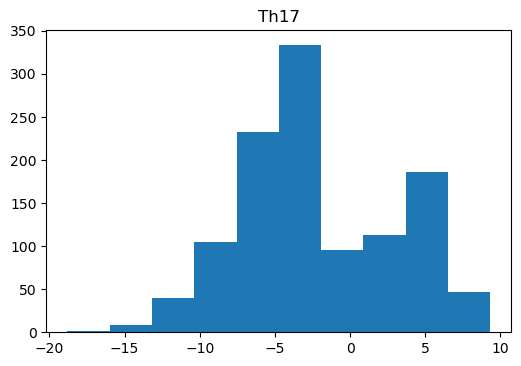

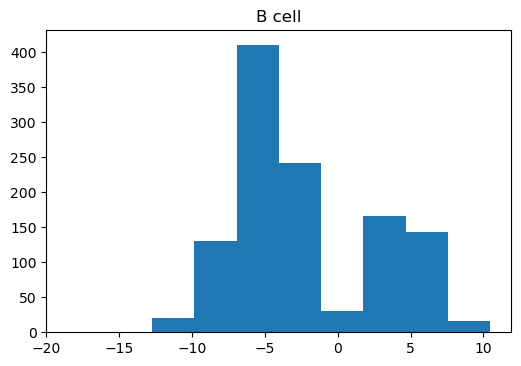

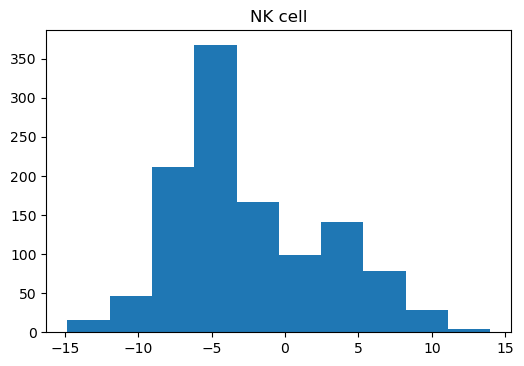

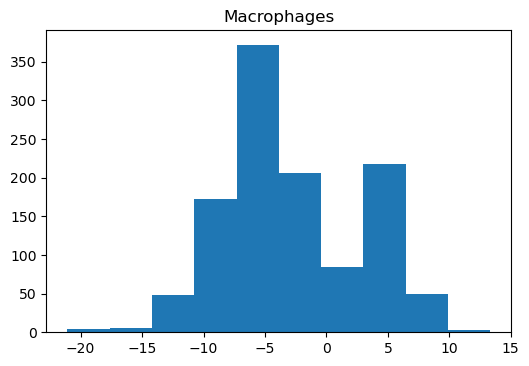

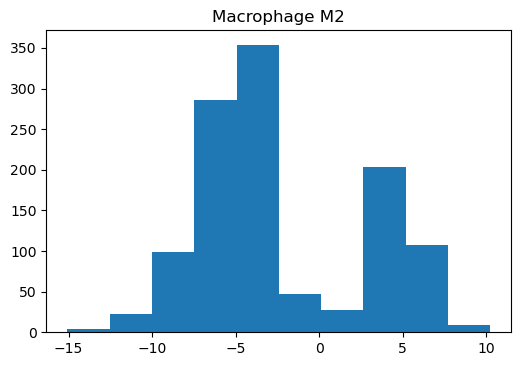

...

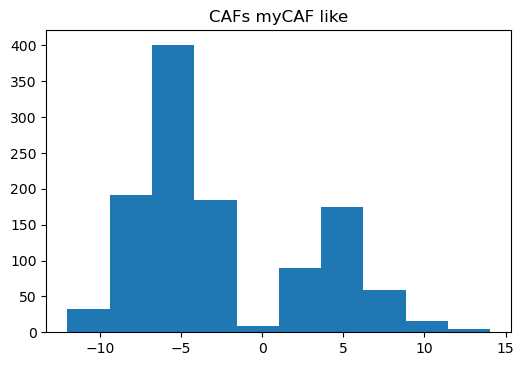

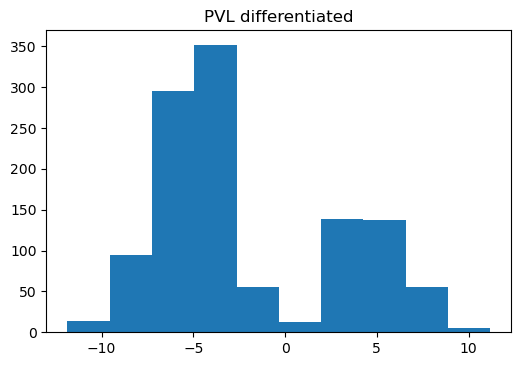

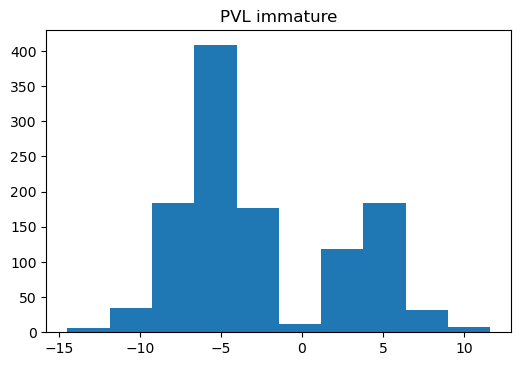

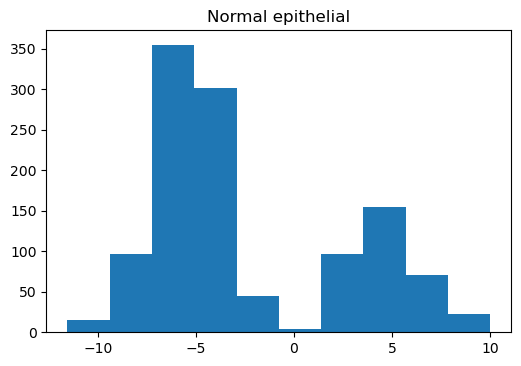

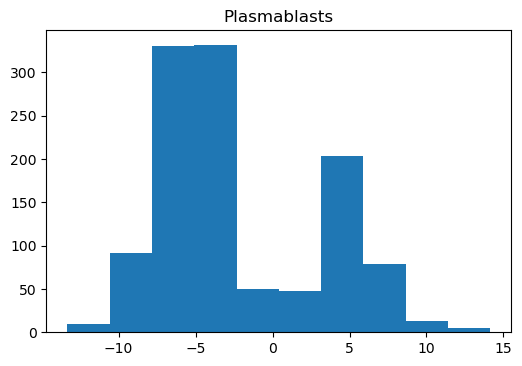

In [47]:
for i in factor_subset.columns:
    plt.figure(dpi=100)
    plt.hist(factor_subset[i])
    plt.title(i)

<ipython-input-48-0ec9b24d1cfb>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi=100)


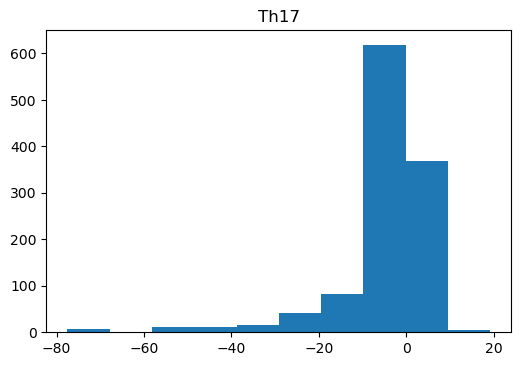

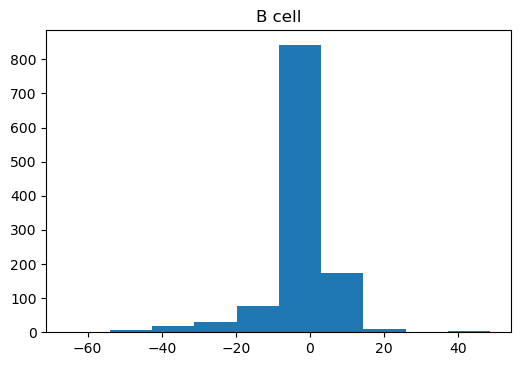

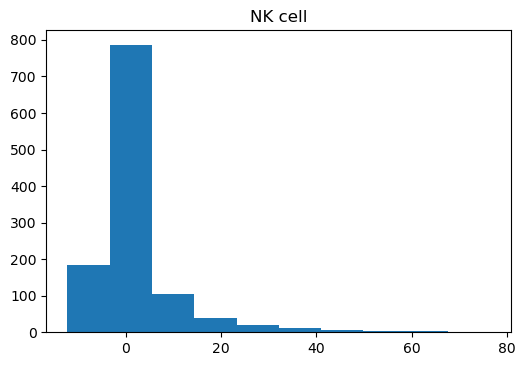

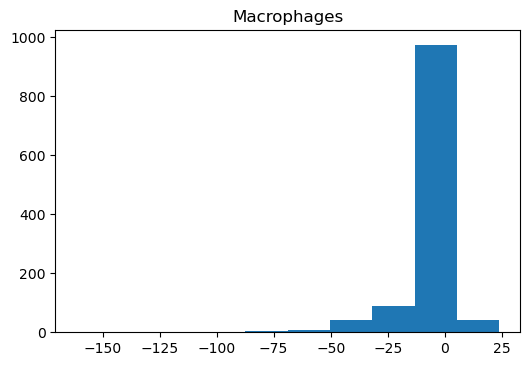

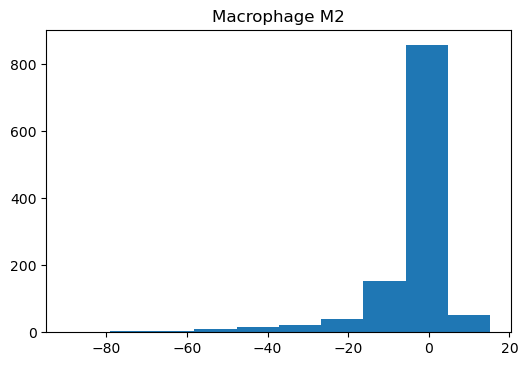

...

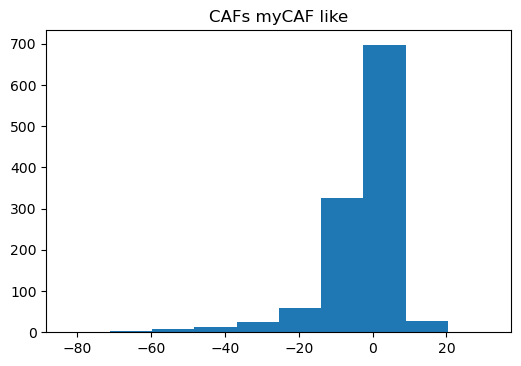

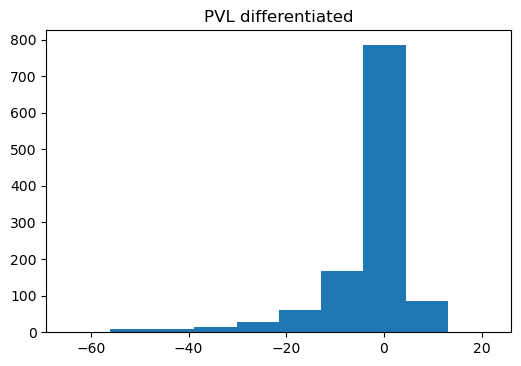

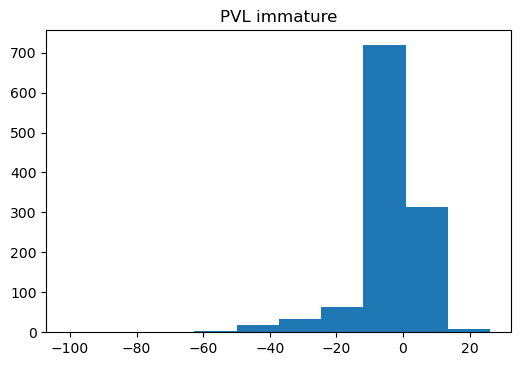

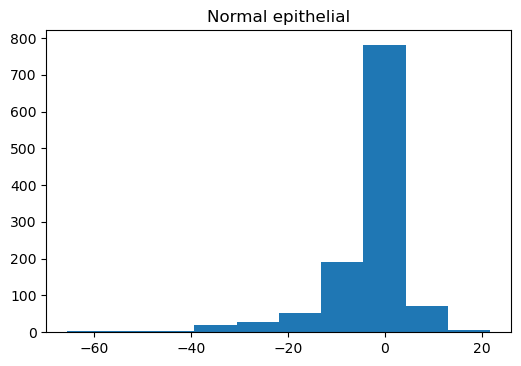

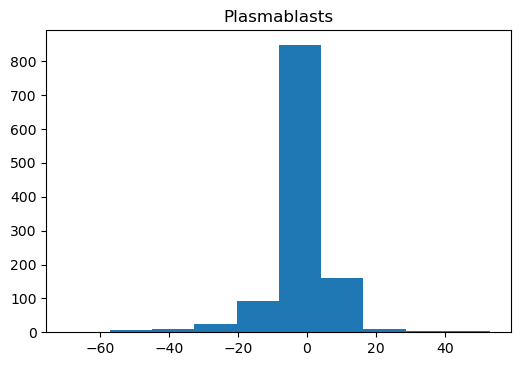

In [48]:
for i in factor_subset.columns:
    plt.figure(dpi=100)
    plt.hist(factor_norm_subset[i])
    plt.title(i)

In [49]:
factor_all_norm

,Th17,B cell,NK cell,Macrophages,Macrophage M2,vCAFs,Endothelial,mCAFs,dCAFS,MDSC,...,cDC,pDC,Terminal exhaustion,Precursor exhaustion,CAFs MSC iCAF like,CAFs myCAF like,PVL differentiated,PVL immature,Normal epithelial,Plasmablasts
AAACACCAATAACTGC-1-MBC_1A,6.797870,-6.974509,13.857911,-14.515241,11.261097,-8.090617,-12.646228,-6.399663,-5.968430,-6.943105,...,-9.840916,5.243763,-9.927872,-8.140488,-10.221631,6.208671,-10.177680,12.420399,-10.231023,11.450274
AAACAGCTTTCAGAAG-1-MBC_1A,-1.013472,-1.643499,-3.672708,-1.917377,-0.953968,-0.977214,-1.457970,-0.957891,-1.736882,-1.180983,...,-0.418600,-1.973721,1.287841,-0.825888,-2.525764,-1.907593,-1.755833,-1.339557,-1.449569,1.055730
AAACAGGGTCTATATT-1-MBC_1A,-0.263224,-0.458897,-0.600402,-1.200345,-0.902404,-0.803397,-0.604129,-0.788191,-0.384963,-0.492690,...,-0.533346,-1.055117,0.169365,-0.944511,-0.784559,-0.985319,-0.957216,-1.245956,-0.986642,-0.312825
AAACATGGTGAGAGGA-1-MBC_1A,-1.295328,-0.811362,-2.214654,0.576782,-1.192777,-0.752358,-1.165726,-1.128259,0.955851,-0.142213,...,-1.275171,-0.418921,0.528264,-0.247429,-1.316045,-1.051331,-0.730567,-0.964995,-0.616947,-0.474507
AAACCGGGTAGGTACC-1-MBC_1A,9.431441,-7.988028,9.365053,5.579650,-6.907436,0.859288,3.621707,-5.431311,-4.581547,-4.156148,...,0.021574,-9.658117,7.084891,2.418003,-10.128033,-6.766721,-3.792718,-4.837682,9.626042,-5.819619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGAGTCTTAATGAAAG-1-1160920F,1.074016,-1.509642,-1.675431,-1.244029,-1.542151,-1.003369,-2.684735,-0.479624,-1.253407,-1.477371,...,-1.497432,-1.609541,-1.903984,-0.616586,-2.065641,-1.856338,-0.998673,-0.921173,2.732822,-2.097822
GAACGTTTGTATCCAC-1-1160920F,-7.166864,-8.736436,-3.450513,-4.642246,-7.631892,-1.306216,-4.815137,-6.029448,-5.376476,-5.230787,...,-5.921313,-4.213894,-16.653331,-1.105067,-9.889729,-13.631964,-1.205336,-9.189073,4.576752,-9.445081
ATTGAATTCCCTGTAG-1-1160920F,-6.684506,-6.113520,-4.763011,-3.612496,-4.596282,-4.577989,-3.783151,-2.330970,-2.808719,-3.644890,...,-3.671844,-5.287563,-8.348722,-2.254780,-5.909543,-7.956761,-2.348293,-3.721282,5.533849,-3.295167
TACCTCACCAATTGTA-1-1160920F,0.760783,-4.466443,-10.826491,-5.376526,-4.815059,-9.010984,-4.245156,-11.646569,-6.153087,-7.092200,...,-1.854611,-8.469730,-6.437082,6.083790,-9.269437,-15.780396,-4.152806,-4.094884,5.321654,-6.869199


In [ ]:
factor_all_norm

## Bicluster

In [249]:
from scipy.stats import zscore

def bi_cluster(slisa_a):
    model = SpectralCoclustering(n_clusters=11, random_state=0)
    model.fit(slisa_a)
    fit_data = slisa_a.iloc[np.argsort(model.row_labels_)]
    fit_data = fit_data[fit_data.columns[np.argsort(model.column_labels_)]]
    return fit_data,model

In [320]:
#fit_data,model = bi_cluster(factor_all_norm.apply(zscore))
fit_data,model = bi_cluster(factor_all_norm)
factor_all.to_csv('../results/03_hubs_0106_newnorm/'+'PoE_alltumors_factor.csv')
fit_data.to_csv('../results/03_hubs_0106_newnorm/'+'PoE_alltumors_bicluster.csv')
row_order_df = pd.DataFrame({'id':factor_all.index,'cluster':model.row_labels_})
row_order_df.index = row_order_df.loc[:,'id']
col_order_df = pd.DataFrame({'id':factor_all.columns,'cluster':model.column_labels_})
col_order_df.to_csv('../results/03_hubs_0106_newnorm/'+'PoE_alltumors_bicluster_res_col_orders_individual.csv')
row_order_df.to_csv('../results/03_hubs_0106_newnorm/'+'PoE_alltumors_bicluster_res_row_orders_individual.csv')